# Overview and Setup

The goal of this post is to build a [RetinaNet model](https://arxiv.org/pdf/1708.02002.pdf) and train it on the [PASCAL VOC](http://host.robots.ox.ac.uk/pascal/VOC/) dataset.
We'll use a couple of tricks, including fine-tuning the RetinaNet's backbone on a related task, to speed up training and get results in about 2 hours total.
Our trained model will predict bounding boxes for 20 classes of objects in images.
For example, the model we train in this post makes the following predictions for the image below.
The decimal numbers in each box label is the model's confidence score for that label.

![An example input image and predicted bounding boxes from the model trained in this post. The input image was taken from [this KerasCV tutorial](https://keras.io/guides/keras_cv/object_detection_keras_cv/)](example_image_predictions.png){#fig-example-predictions}

In [1]:
#| echo: false

# these imports are only used to make the table of package versions
import fastai
import albumentations
import numpy
import torch
import pandas as pd
import matplotlib
import pycocotools
import sys
from IPython.display import Markdown

In [2]:
import albumentations as A
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import os

In [3]:
#| echo: false

package_list = [
    ('python',          sys.version.split()[0]),
    ('PyTorch',         torch.__version__),
    ('torchvision',     torchvision.__version__),
    ('fastai',          fastai.__version__),
    ('matplotlib',      matplotlib.__version__),
    ('numpy',           numpy.__version__),
    ('albumentations',  albumentations.__version__),
    ('pycocotools',     '2.0.7'),
]

Markdown(
    pd.DataFrame(package_list, columns=['Package', 'Version'])
      .to_markdown(index=False)
)

| Package        | Version      |
|:---------------|:-------------|
| python         | 3.9.16       |
| PyTorch        | 2.2.1+cu121  |
| torchvision    | 0.17.1+cu121 |
| fastai         | 2.7.14       |
| matplotlib     | 3.8.3        |
| numpy          | 1.25.2       |
| albumentations | 1.4.2        |
| pycocotools    | 2.0.7        |

# Get and Format the Data

We'll use fastai's versions of the PASCAL VOC datasets.
We'll combine the 2007 and 2012 training and validation sets to use as our training set, and we'll use the 2007 test set as our validation set.

In [4]:
from fastai.vision.all import untar_data, URLs

path_2007 = untar_data(URLs.PASCAL_2007)
os.listdir(path_2007)

['test.json',
 'test.csv',
 'segmentation',
 'valid.json',
 'train',
 'test',
 'train.csv',
 'train.json']

In [5]:
path_2012 = untar_data(URLs.PASCAL_2012)
os.listdir(path_2012)

['segmentation', 'valid.json', 'train', 'test', 'train.csv', 'train.json']

In [6]:
train_data_sources = [
    path_2007/'train.json',
    path_2007/'valid.json',
    path_2012/'train.json',
    path_2012/'valid.json',
]
valid_data_source = path_2007/'test.json'

The annotation JSON files are in the COCO format, and fastai has a convenience `get_annotations` function to extract the data relevant for our task.
To speed up training the RetinaNet, we'll first fine-tune the ResNet backbone on a multilabel classification task.
For organizational efficiency, we'll generate and store the targets for both the classification and object detection tasks together and extract the relevant targets for each task when needed with custom `Dataset`s and `DataLoader` collation functions.

In [7]:
from fastai.vision.all import get_annotations
from itertools import chain, starmap

def get_vocab_dicts(data_source):
    _, targets = get_annotations(data_source)
    all_labels = set().union(*(set(o[1]) for o in targets))
    all_labels = sorted(all_labels)
    idx2label = dict(enumerate(all_labels))
    label2idx = {v: k for k, v in idx2label.items()}
    return idx2label, label2idx

def organize_annotations(train_data_sources, valid_data_source):
    train_images, train_targets = [
        list(chain.from_iterable(o))
        for o in zip(*[get_annotations(source, prefix=str(source.parent)+'/train/')
                       for source in train_data_sources])
    ]
    valid_images, valid_targets = get_annotations(
        valid_data_source, prefix=str(valid_data_source.parent)+'/test/'
    )
    _, label2idx = get_vocab_dicts(train_data_sources[0])
    return (
        (train_images, train_targets, label2idx),
        (valid_images, valid_targets, label2idx)
    )

def reformat_data(imgs, targs, label2idx):
    result = [
        {'image': img,
         'bboxes': targ[0],
         'labels': [label2idx[o] for o in targ[1]]}
        for img, targ in zip(imgs, targs)
    ]
    for item in result:
        multilabel = [0] * len(label2idx)
        for i in set(item['labels']):
            multilabel[i] = 1
        item |= {'multilabel': multilabel}
    return result

def organize_data(train_data_sources, valid_data_source):
    results = organize_annotations(
        train_data_sources, valid_data_source
    )
    return starmap(reformat_data, results)

train_data, valid_data = organize_data(
    train_data_sources, valid_data_source
)

Now let's take a look at how we've formatted the data.

In [8]:
train_data[1]

{'image': '/root/.fastai/data/pascal_2007/train/000017.jpg',
 'bboxes': [[184, 61, 279, 199], [89, 77, 403, 336]],
 'labels': [14, 12],
 'multilabel': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0]}

For later use, we'll generate dictionaries to go back and forth between integer and string class labels.

In [9]:
idx2label, label2idx = get_vocab_dicts(train_data_sources[0])
idx2label

{0: 'aeroplane',
 1: 'bicycle',
 2: 'bird',
 3: 'boat',
 4: 'bottle',
 5: 'bus',
 6: 'car',
 7: 'cat',
 8: 'chair',
 9: 'cow',
 10: 'diningtable',
 11: 'dog',
 12: 'horse',
 13: 'motorbike',
 14: 'person',
 15: 'pottedplant',
 16: 'sheep',
 17: 'sofa',
 18: 'train',
 19: 'tvmonitor'}

# Visualize the Data

Let's take a look at some of the images in our dataset together with their bounding box annotations.

In [10]:
#| code-fold: true
#| code-summary: "Image Plotting Functions"

import matplotlib.patheffects as path_effects
from fastai.vision.all import PILImage, Path
from PIL import Image


cmap = matplotlib.colormaps['tab20']
imagenet_stats = {
    'mean': [0.485, 0.456, 0.406],
    'std': [0.229, 0.224, 0.225],
}


def draw_bbox(ax, bbox, label, alpha=1.0):
    x0, y0, x1, y1 = bbox
    box = matplotlib.patches.Rectangle(
        (x0, y0), x1 - x0, y1 - y0,
        facecolor='none',
        linewidth=2,
        edgecolor=cmap(label),
        alpha=alpha,
    )
    border_effects = [
        path_effects.Stroke(linewidth=5, foreground='black', alpha=alpha),
        path_effects.Normal()
    ]
    box.set_path_effects(border_effects)
    ax.add_patch(box)


def add_bbox_label(ax, bbox, label, alpha=1.0):
    props = dict(
        boxstyle='square',
        facecolor=cmap(label),
        edgecolor='black',
        linewidth=1.1,
        alpha=alpha
    )
    x0, y0, _, _ = bbox
    if isinstance(label, torch.Tensor):
        label = label.item()
    ax.text(
        x0, y0, idx2label[label],
        bbox=props,
        color='black',
        fontsize=8,
        in_layout=True
    )


def decode(image):
    if isinstance(image, Path):
        image = Image.open(image)
    if isinstance(image, torch.Tensor):
        if image.shape[0] <= 3:
            image = image.permute(1, 2, 0)
        image = image.cpu().numpy()
    if isinstance(image, np.ndarray):
        if image.dtype == np.float32:
            mean = np.array(imagenet_stats['mean'])[None, None]
            std = np.array(imagenet_stats['std'])[None, None]
            image = (image*std + mean) * 255.0
            image = image.astype(np.uint8)
        image = Image.fromarray(image)
    return image


def plot_image_with_annotations(image, bboxes, labels, ax=None, alpha=1.0, **kwargs):
    if isinstance(image, str):
        image = PILImage.create(image)
    image = decode(image)
    if isinstance(bboxes, torch.Tensor):
        bboxes = bboxes.cpu().numpy()
    if isinstance(labels, torch.Tensor):
        labels = labels.cpu().numpy()

    if ax is None:
        fig, ax = plt.subplots()
        fig.tight_layout()
    ax.imshow(image)
    ax.axis('off')

    for bbox, label in zip(bboxes, labels):
        draw_bbox(ax, bbox, label, alpha=alpha)
        add_bbox_label(ax, bbox, label, alpha=alpha)

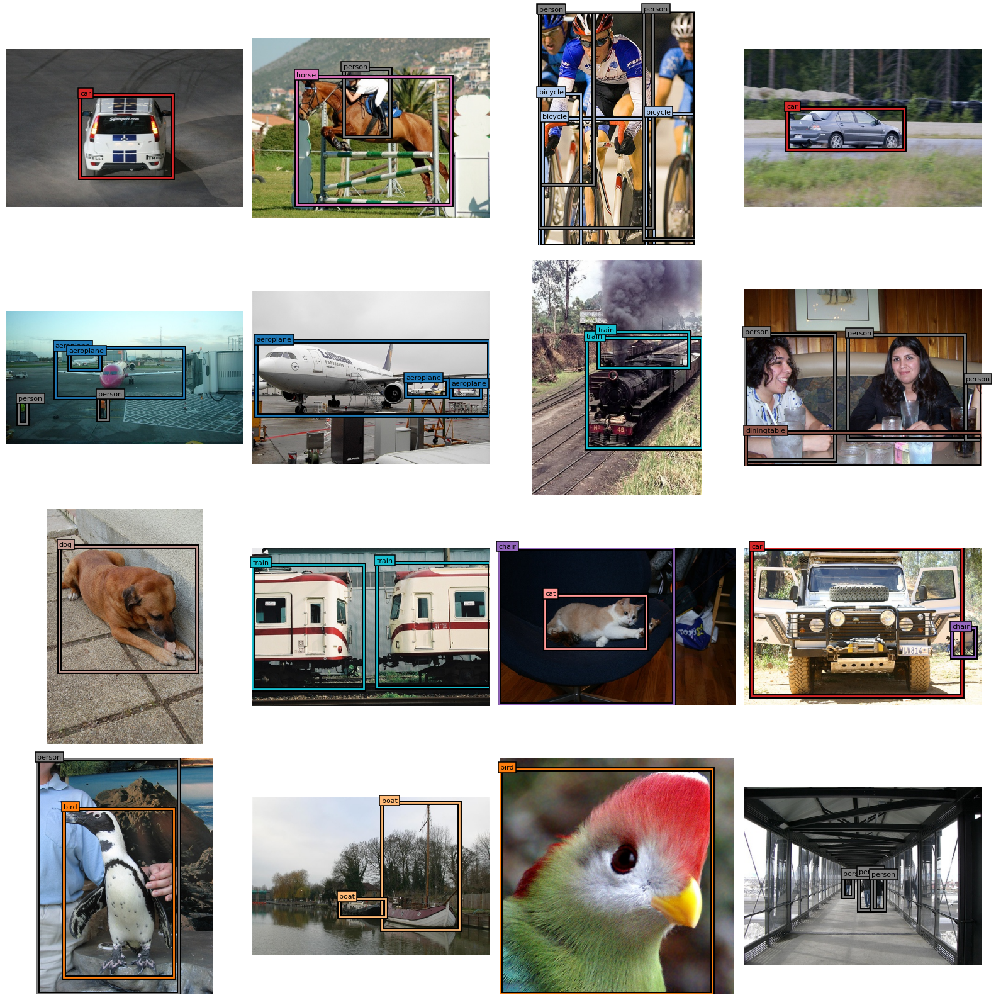

In [11]:
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))
for idx, ax in enumerate(axs.flat):
    plot_image_with_annotations(**train_data[idx], ax=ax)
fig.tight_layout()

# Multi-Label Classification

Our first task is to fine-tune a ResNet to do multi-label classification on our dataset.
As mentioned above, we'll use a custom `Dataset` to extract only the targets that we need for this task.

In [12]:
def_device = ('cuda' if torch.cuda.is_available()
              else 'mps' if torch.backends.mps.is_available()
              else 'cpu')

class MultilabelDataset(torch.utils.data.Dataset):
    def __init__(self, items, tfms=None, device=def_device):
        self.items = items
        self.tfms = tfms
        self.device = device
    
    def __len__(self):
        return len(self.items)
    
    def __getitem__(self, idx):
        item = self.items[idx]
        image_as_array = {'image': self.open_as_array(item['image'])}
        item = item | image_as_array
        item = {k: item[k] for k in ['image', 'multilabel']}
        if self.tfms is not None:
            item = item | self.tfms(image=item['image'])
        return {k: torch.tensor(item[k]).float()
                for k in ['image', 'multilabel']}
    
    def open_as_array(self, image):
        return np.array(Image.open(image))

Now we'll set up our image transforms and create our training and validation datasets for this task.
We'll pad all of the images to be $600 \times 600$ to make them a uniform size while maintaining the aspect ratios of the bounding boxes in our later object detection model.
We'll also use minimal data augmentation: just random flips, since that's all we'll use for the object detection model.

In [13]:
image_size = 600

imagenet_stats = {
    'mean': [0.485, 0.456, 0.406],
    'std': [0.229, 0.224, 0.225],
}

pad_params = {
    'min_height': image_size,
    'min_width': image_size,
    'position': 'top_left',
    'border_mode': 0,
    'value': 0,
}

multilabel_train_tfms = A.Compose(
    transforms=[
        A.Flip(p=0.5),
        A.PadIfNeeded(**pad_params),
        A.Normalize(**imagenet_stats),
    ]
)

multilabel_valid_tfms = A.Compose(
    transforms=[
        A.PadIfNeeded(**pad_params),
        A.Normalize(**imagenet_stats),
    ]
)

multilabel_train_ds = MultilabelDataset(
    train_data, tfms=multilabel_train_tfms
)

multilabel_valid_ds = MultilabelDataset(
    valid_data, tfms=multilabel_valid_tfms
)

::: {.column-margin}
Padding the images in this way was inspired by [this KerasCV tutorial](https://keras.io/guides/keras_cv/object_detection_keras_cv/).
:::

Now let's visualize our transformed data.

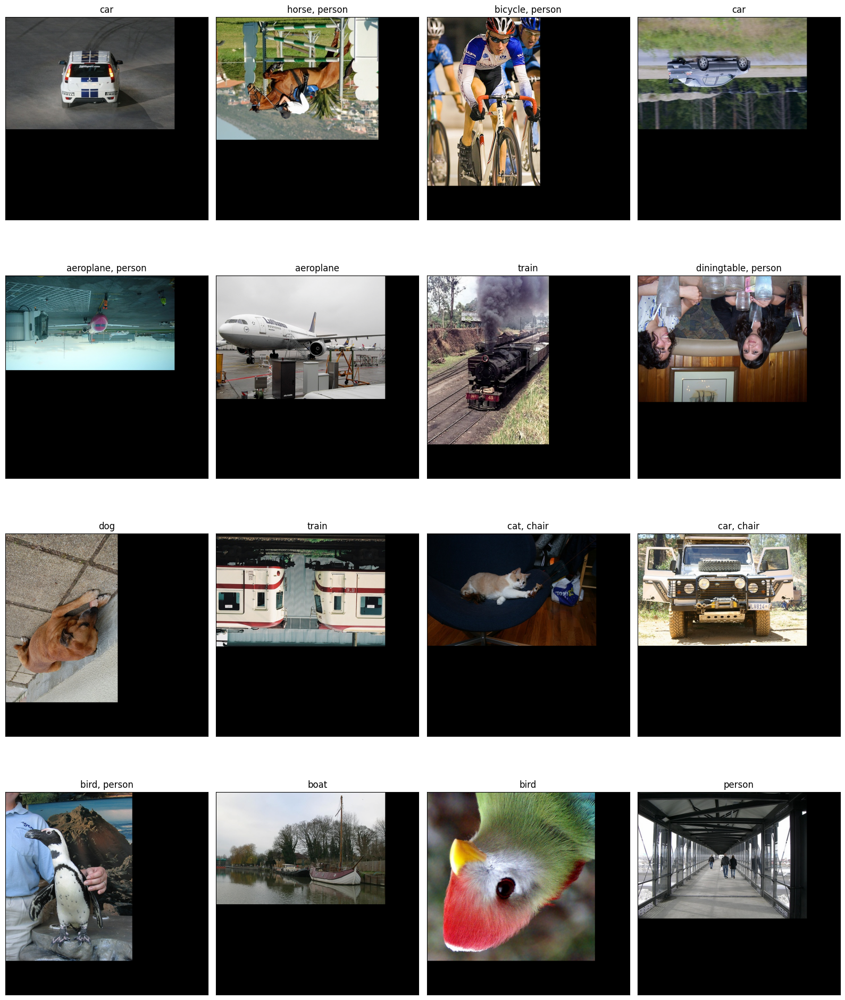

In [14]:
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(16, 20))
for idx, ax in enumerate(axs.flat):
    item = multilabel_train_ds[idx]
    image, target = item['image'], item['multilabel']
    title = ', '.join([idx2label[i.item()] for i in target.nonzero()])
    ax.imshow(decode(image))
    ax.set(xticks=[], yticks=[], title=title)
fig.tight_layout()

We'll use a custom collation function put our images in channels-first format.

In [15]:
from fastai.vision.all import DataLoader, DataLoaders

def multilabel_collate(batch):
    images = torch.stack([o['image'].permute(2, 0, 1) for o in batch])
    multilabels = torch.stack([o['multilabel'] for o in batch])
    return images, multilabels

multilabel_config = {
    'bs': 24,
    'create_batch': multilabel_collate,
    'device': def_device,
    'num_workers': 8
}

multilabel_train_dl = DataLoader(
    multilabel_train_ds, shuffle=True, **multilabel_config
)
multilabel_valid_dl = DataLoader(
    multilabel_valid_ds, shuffle=False, **multilabel_config
)

multilabel_dls = DataLoaders(multilabel_train_dl, multilabel_valid_dl)

Now we'll define our multi-label image classification model.
One of the tricks we'll use to get better object detection results later on is to use Mish as our activation function instead of ReLU.

In [16]:
from fastai.vision.all import create_body, create_head, resnet101

class MultilabelModel(nn.Module):
    def __init__(self, n_out):
        super().__init__()

        self.backbone = create_body(resnet101(weights='DEFAULT'))
        self.head = create_head(2048, n_out)

        self.backbone = self.swap_activation(self.backbone)
        self.head = self.swap_activation(self.head)
    
    def forward(self, x):
        x = self.backbone(x)
        return self.head(x)
    
    def swap_activation(self, module, old_act=nn.ReLU, new_act=nn.Mish):
        for name, submodule in module._modules.items():
            if len(list(submodule.children())) > 0:
                module._modules[name] = self.swap_activation(submodule)
            if isinstance(submodule, old_act):
                module._modules[name] = new_act(inplace=True)
        return module

::: {.column-margin}
The code for `swap_activation` was adapted from [this notebook by Radek Osmulski](https://github.com/radekosmulski/imagenette-LB-entry/blob/main/imagenette%20-%205%20epochs.ipynb).
:::

Now we can find a good learning rate and fine-tune our multi-label classification model.

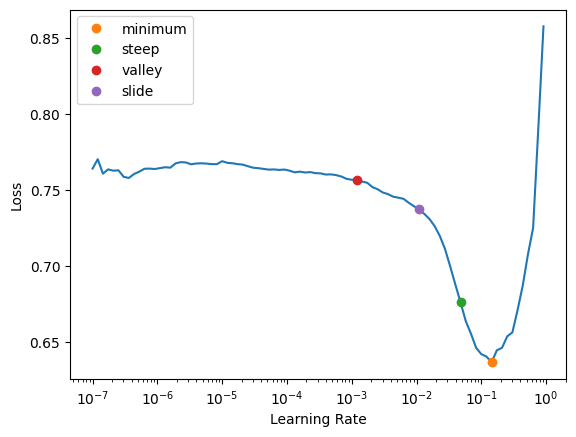

In [17]:
from fastai.vision.all import (
    params, L, accuracy_multi, Learner,
    minimum, steep, valley, slide
)

def multilabel_split(model):
    return L(
        model.backbone[:6],
        model.backbone[6:],
        model.head
    ).map(params)

multilabel_learn = Learner(
    dls=multilabel_dls,
    model=MultilabelModel(20),
    loss_func=nn.BCEWithLogitsLoss(),
    metrics=accuracy_multi,
    splitter=multilabel_split
)

multilabel_learn.freeze()
multilabel_lrs = multilabel_learn.lr_find(
    suggest_funcs=(minimum, steep, valley, slide)
)

In [18]:
multilabel_learn.fine_tune(3, multilabel_lrs.slide)

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.121236,0.070566,0.975909,06:49


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.107960,0.075465,0.974031,08:07
1,0.081165,0.059422,0.979069,08:07
2,0.051065,0.047460,0.983330,08:07


# Object Detection

Now we'll build a RetinaNet model using our fine-tuned ResNet as the backbone.
We'll need a new dataset class since our targets for object detection are different.

In [19]:
class ObjectDetectionDataset(torch.utils.data.Dataset):
    def __init__(self, items, tfms=None, device=def_device):
        self.items = items
        self.tfms = tfms
        self.device = device
    
    def __len__(self):
        return len(self.items)
    
    def __getitem__(self, idx):
        item = self.items[idx]
        image_as_array = {'image': self.open_as_array(item['image'])}
        item = item | image_as_array
        item = {k: item[k] for k in ['image', 'bboxes', 'labels']}
        if self.tfms is not None:
            item = self.tfms(**item)
        return {
            k: torch.tensor(item[k]).to(t)
            for k, t in [
                ['image', torch.float32],
                ['bboxes', torch.float32],
                ['labels', torch.int64]
            ]
        }

    def open_as_array(self, image):
        return np.array(Image.open(image))

Now we'll set up the data processing pipeline for our object detection model.
We'll re-use the `image_size`, `imagenet_stats`, and `pad_params` from [the multi-label classification model](#multi-label-classification).

In [20]:
bbox_params = {
    'format': 'pascal_voc',
    'min_visibility': 0.2,
    'label_fields': ['labels']
}

object_detection_train_tfms = A.Compose(
    transforms=[
        A.BBoxSafeRandomCrop(),
        A.Flip(p=0.5),
        A.PadIfNeeded(**pad_params),
        A.Normalize(**imagenet_stats),
    ], bbox_params=A.BboxParams(**bbox_params)
)

object_detection_valid_tfms = A.Compose(
    transforms=[
        A.PadIfNeeded(**pad_params),
        A.Normalize(**imagenet_stats),
    ], bbox_params=A.BboxParams(**bbox_params)
)

train_ds = ObjectDetectionDataset(
    train_data, tfms=object_detection_train_tfms
)

valid_ds = ObjectDetectionDataset(
    valid_data, tfms=object_detection_valid_tfms
)

Let's visualize our object detection data with the transforms above.

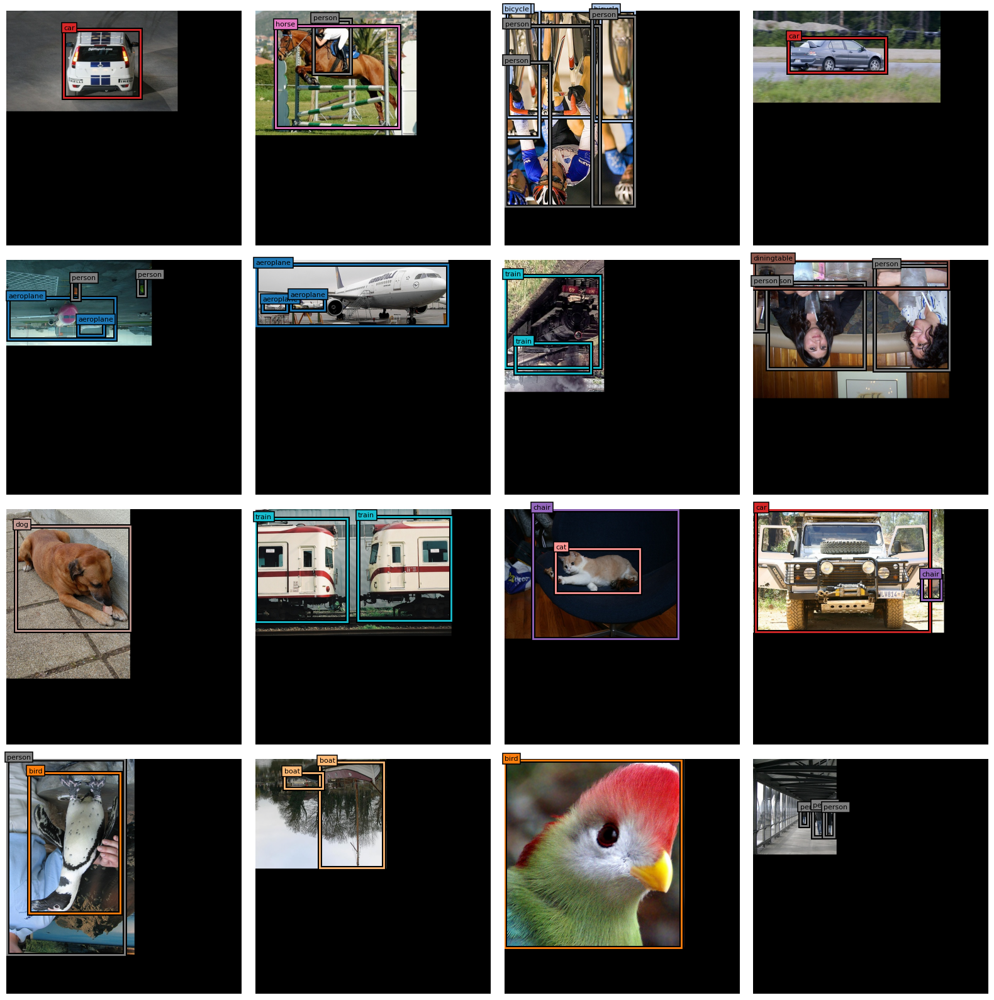

In [21]:
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))
for idx, ax in enumerate(axs.flat):
    plot_image_with_annotations(**train_ds[idx], ax=ax)
fig.tight_layout()

The number of bounding boxes and labels varies from image to image, so we'll need to pad those targets when collating each batch.

In [22]:
def pad_bboxes(bboxes, max_targets):
    pad_size = max_targets - len(bboxes)
    padding = torch.tensor([[-100] * 4] * pad_size, device=bboxes.device)
    return torch.cat([bboxes, padding])

def pad_labels(labels, max_targets):
    pad_size = max_targets - len(labels)
    padding = torch.tensor([-100] * pad_size, device=labels.device)
    return torch.cat([labels, padding])

def object_detection_collate(batch):
    images = torch.stack([o['image'].permute(2, 0, 1) for o in batch])
    max_targets = max(len(o['labels']) for o in batch)
    bboxes = torch.stack([pad_bboxes(o['bboxes'], max_targets) for o in batch])
    labels = torch.stack([pad_labels(o['labels'], max_targets) for o in batch])
    return images, bboxes, labels

object_detection_config = {
    'bs': 8,
    'create_batch': object_detection_collate,
    'device': def_device,
    'num_workers': 8
}

object_detection_train_dl = DataLoader(
    train_ds, shuffle=True, **object_detection_config
)

object_detection_valid_dl = DataLoader(
    valid_ds, shuffle=False, **object_detection_config
)

Now we'll define our object detection model.

In [23]:
from fastai.vision.all import hook_outputs
from functools import partial
import math

def conv_with_init(
        n_in,
        n_out,
        kernel_size=3,
        stride=1,
        bias=True,
        weight_init=nn.init.kaiming_normal_,
        bias_init=partial(nn.init.constant_, val=0.0)
    ):
    conv = nn.Conv2d(n_in, n_out, kernel_size=kernel_size,
                     stride=stride, padding=kernel_size//2, bias=bias)
    weight_init(conv.weight)
    bias_init(conv.bias)
    return conv

class ObjectDetectionHead(nn.Module):
    def __init__(self, n_out, n_anchors, bias_init_val):
        super().__init__()
        self.n_out = n_out
        layers = []
        for _ in range(4):
            layers += [conv_with_init(256, 256),
                       nn.Mish()]
        layers += [conv_with_init(
            256, n_out * n_anchors,
            weight_init=partial(nn.init.constant_, val=0.0),
            bias_init=partial(nn.init.constant_, val=bias_init_val)
        )]
        self.head = nn.Sequential(*layers)
    
    def forward(self, x):
        return torch.cat(
            [self.reshape(self.head(o), self.n_out) for o in x], dim=1
        )
    
    def reshape(self, x, n_out):
        return (x.permute(0, 2, 3, 1)
                 .reshape(x.shape[0], -1, n_out))

class ObjectDetectionModel(nn.Module):
    def __init__(self, n_anchors, backbone=None):
        super().__init__()
        self.backbone = create_body(resnet101()) if backbone is None else backbone

        # FPN top path
        self.c5top5 = conv_with_init(2048, 256, kernel_size=1)
        self.c5top6 = conv_with_init(2048, 256, stride=2)
        self.p6top7 = nn.Sequential(nn.Mish(),
                                    conv_with_init(256, 256, stride=2))

        # FPN down path
        self.c4_cross = conv_with_init(1024, 256, kernel_size=1)
        self.c3_cross = conv_with_init(512, 256, kernel_size=1)

        # smooth results of FPN down path
        self.p3_out = conv_with_init(256, 256)
        self.p4_out = conv_with_init(256, 256)
        self.p5_out = conv_with_init(256, 256)

        # bounding box regression head and image classification head
        self.box_head = ObjectDetectionHead(4, n_anchors, 0.0)
        prior = -math.log((1 - 0.01) / 0.01)
        self.class_head = ObjectDetectionHead(20, n_anchors, prior)
    
    def forward(self, x):
        hook_layers = self.backbone[-3:-1]
        with hook_outputs(hook_layers, detach=False) as h:
            c5 = self.backbone(x)
        c3, c4 = h.stored

        # FPN top path
        p5 = self.c5top5(c5)
        p6 = self.c5top6(c5)
        p7 = self.p6top7(p6)

        # FPN down path
        p4 = self.c4_cross(c4) + F.interpolate(p5, size=38, mode='nearest-exact')
        p3 = self.c3_cross(c3) + F.interpolate(p4, size=75, mode='nearest-exact')
        
        # smooth results of FPN down path
        p3 = self.p3_out(p3)
        p4 = self.p4_out(p4)
        p5 = self.p5_out(p5)

        fpn_out = [p3, p4, p5, p6, p7]
        return self.box_head(fpn_out), self.class_head(fpn_out)

::: {.column-margin}
The code for the model is partially based on code from [this Keras tutorial](https://keras.io/examples/vision/retinanet/#building-feature-pyramid-network-as-a-custom-layer) and [this notebook](https://github.com/fastai/course-v3/blob/master/nbs/dl2/pascal.ipynb) from an old version of the fastai course.
:::

Now we'll define our loss function, starting with code to generate anchor boxes.

In [24]:
from torchvision.ops import box_convert, box_iou
from itertools import product

def generate_centers(grid_size):
    coords = torch.arange(0, grid_size, dtype=torch.float32, device=def_device) + 0.5
    centers = torch.stack(torch.meshgrid(coords, coords.clone(), indexing='xy'), dim=-1)
    return centers

def generate_one_anchor_grid(
        image_size,
        grid_size,
        area,
        aspect_ratio,
        scale
    ):
    height = math.sqrt(area / aspect_ratio)
    width = area / height
    centers = generate_centers(grid_size) * (image_size / grid_size)
    heights = torch.full((grid_size, grid_size, 1), scale * height, device=def_device)
    widths = torch.full((grid_size, grid_size, 1), scale * width, device=def_device)
    return torch.cat([centers, widths, heights], dim=-1)

def generate_anchor_grids(
        image_size,
        grid_size,
        area,
        aspect_ratios=None,
        scales=None
    ):
    if aspect_ratios is None:
        aspect_ratios = [1/2, 1, 2]
    if scales is None:
        scales = [math.pow(2, i / 3) for i in range(3)]
    anchors = torch.empty(
        grid_size, grid_size, len(aspect_ratios) * len(scales), 4,
        dtype=torch.float32, device=def_device
    )
    for i, (r, s) in enumerate(product(aspect_ratios, scales)):
        anchors[..., i, :] = generate_one_anchor_grid(
            image_size, grid_size, area, r, s
        )
    return anchors.view(-1, 4)

def generate_anchor_boxes(
        image_size,
        areas=None,
        grid_sizes=None,
        aspect_ratios=None,
        scales=None
    ):
    if grid_sizes is None:
        grid_sizes = [75, 38, 19, 10, 5]
    if areas is None:
        areas = [(4 * image_size / grid_size)**2 for grid_size in grid_sizes]
    return torch.cat(
        [generate_anchor_grids(image_size, grid_size, area, aspect_ratios, scales)
         for area, grid_size in zip(areas, grid_sizes)]
    )

::: {.column-margin}
The code to generate anchor boxes is partially based on code from [this Keras tutorial](https://keras.io/examples/vision/retinanet/#implementing-smooth-l1-loss-and-focal-loss-as-keras-custom-losses) and [this notebook](https://github.com/fastai/course-v3/blob/master/nbs/dl2/pascal.ipynb) from an old version of the fastai course.
:::

For the loss function itself, we'll use complete iou loss for the bounding box targets and focal loss for the classification targets.

In [26]:
from torchvision.ops import sigmoid_focal_loss, complete_box_iou_loss

class ObjectDetectionLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.anchors = generate_anchor_boxes(600)
        self.box_loss_func = complete_box_iou_loss
        self.class_loss_func = sigmoid_focal_loss

    def forward(self, pred, *targ):
        losses = []
        batch_size = pred[0].shape[0]
        for pb, pc, tb, tc in zip(*pred, *targ):
            tb, tc = self.unpad(tb, tc)
            assignments = self.assign_anchors(self.anchors, tb)
            box_mask = assignments >= 0
            if box_mask.sum() > 0:
                tb = tb[assignments[box_mask]]
                an = self.anchors[box_mask]
                pb = pb[box_mask]
                pred_boxes = self.compute_pred_boxes(pb, an)
                pred_boxes = box_convert(pred_boxes, 'cxcywh', 'xyxy')
                box_loss = self.box_loss_func(pred_boxes, tb, reduction='mean')
            else:
                box_loss = 0.0
            class_mask = assignments >= -1
            if class_mask.sum() > 0:
                class_assignments = tc[assignments[box_mask]] + 1
                tc = self.compute_one_hot_targets(class_assignments, box_mask, class_mask)
                class_loss = self.class_loss_func(pc[class_mask], tc.float(), reduction='sum')
                class_loss = class_loss / box_mask.sum().clamp_min(1)
            else:
                class_loss = 0.0
            losses.append(box_loss + class_loss)
        return sum(losses) / batch_size

    def unpad(self, targ_boxes, targ_classes):
        mask = (targ_classes != -100)
        return targ_boxes[mask], targ_classes[mask]

    def assign_anchors(self, anchors, targ_boxes, foreground_thresh=0.5, background_thresh=0.4):
        anchors = box_convert(anchors, in_fmt='cxcywh', out_fmt='xyxy')
        iou_matrix = box_iou(anchors, targ_boxes)
        max_iou, prelim_assignments = iou_matrix.max(dim=1)
        foreground_mask = (max_iou > foreground_thresh)
        background_mask = (max_iou < background_thresh)
        assignments = torch.full((anchors.shape[0],), fill_value=-2, device=def_device)
        assignments[foreground_mask] = prelim_assignments[foreground_mask]
        assignments[background_mask] = -1
        return assignments
    
    def compute_pred_boxes(self, box_preds, anchors):
        result = torch.empty_like(anchors)
        result[..., :2] = box_preds[..., :2] * anchors[..., 2:] + anchors[..., :2]
        result[..., 2:] = anchors[..., 2:] * torch.exp(box_preds[..., 2:])
        return result
    
    def compute_one_hot_targets(self, class_assignments, box_mask, class_mask):
        result = torch.zeros(
            (box_mask.shape[0],), device=class_assignments.device
        )
        result[box_mask] = class_assignments
        result = result[class_mask]
        return F.one_hot(result.long(), num_classes=21)[:, 1:]

::: {.column-margin}
The code for the loss function is partially based on code from [this Keras tutorial](https://keras.io/examples/vision/retinanet/#implementing-smooth-l1-loss-and-focal-loss-as-keras-custom-losses) and [this notebook](https://github.com/fastai/course-v3/blob/master/nbs/dl2/pascal.ipynb) from an old version of the fastai course.
:::

Finally, we'll create a fastai `DataLoaders` and train our model.

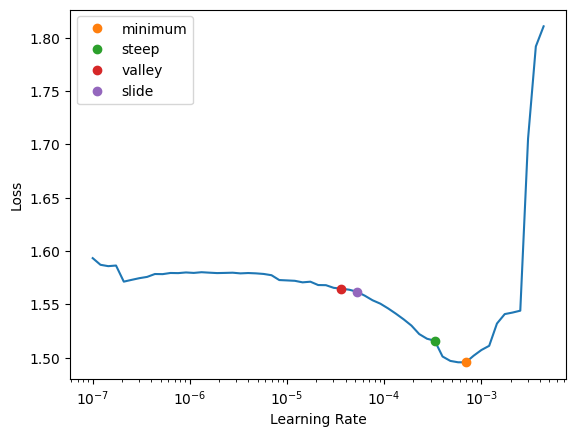

In [27]:
object_detection_dls = DataLoaders(
    object_detection_train_dl, object_detection_valid_dl
)

# the Learner needs to know the number of inputs to the model
object_detection_dls.n_inp = 1

object_detection_backbone = multilabel_learn.model.backbone

object_detection_model = ObjectDetectionModel(
    n_anchors=9, backbone=object_detection_backbone
)

object_detection_learn = Learner(
    dls=object_detection_dls,
    model=object_detection_model,
    loss_func=ObjectDetectionLoss(),
).to_fp16()

object_detection_lrs = object_detection_learn.lr_find(
    suggest_funcs=(minimum, steep, valley, slide)
)

In [28]:
object_detection_learn.fit_one_cycle(10, 1e-4)

epoch,train_loss,valid_loss,time
0,0.721214,0.723528,09:23
1,0.545930,0.582645,09:23
2,0.459409,0.476774,09:24
3,0.399870,0.447026,09:24
4,0.350284,0.405484,09:26
5,0.309018,0.382009,09:28
6,0.283841,0.362980,09:29
7,0.250841,0.359760,09:28
8,0.232529,0.359746,09:27
9,0.207503,0.358098,09:27


Now let's visualize the outputs of our trained RetinaNet.

In [29]:
#| code-fold: true
#| code-summary: "Inference Image Plotting Functions"

def draw_inference_bbox(ax, bbox, label, score, alpha=1.0):
    x0, y0, x1, y1 = bbox
    box = matplotlib.patches.Rectangle(
        (x0, y0), x1 - x0, y1 - y0,
        facecolor='none',
        linewidth=2,
        edgecolor=cmap(label),
        alpha=alpha,
        zorder=100*score.item(),
    )
    border_effects = [
        path_effects.Stroke(linewidth=5, foreground='black', alpha=alpha),
        path_effects.Normal()
    ]
    box.set_path_effects(border_effects)
    ax.add_patch(box)


def add_bbox_inference_label(ax, bbox, label, score, alpha=1.0):
    props = dict(
        boxstyle='square',
        facecolor=cmap(label),
        edgecolor='black',
        linewidth=1.1,
        alpha=alpha,
        zorder=100*score.item()
    )
    x0, y0, _, _ = bbox
    if isinstance(label, torch.Tensor):
        label = label.item()
    ax.text(
        x0, y0, idx2label[label] + f' {score.item():.2f}',
        bbox=props,
        color='black',
        fontsize=8,
        in_layout=True,
        zorder=100*score.item()
    )


def plot_image_with_inference_annotations(
        image,
        bboxes,
        labels,
        scores,
        ax=None,
        alpha=1.0
    ):
    image = decode(image)
    if isinstance(bboxes, torch.Tensor):
        bboxes = bboxes.cpu().numpy()
    if isinstance(labels, torch.Tensor):
        labels = labels.cpu().numpy()
    if ax is None:
        fig, ax = plt.subplots()
        fig.tight_layout()
    ax.imshow(image)
    ax.axis('off')

    for bbox, label, score in zip(bboxes, labels, scores):
        draw_inference_bbox(ax, bbox, label, score, alpha=alpha)
        add_bbox_inference_label(ax, bbox, label, score, alpha=alpha)


from torchvision.ops import clip_boxes_to_image, batched_nms


def compute_pred_boxes(boxes, anchors):
    result = torch.empty_like(anchors)
    result[..., :2] = boxes[..., :2] * anchors[..., 2:] + anchors[..., :2]
    result[..., 2:] = anchors[..., 2:] * torch.exp(boxes[..., 2:])
    return result


def postprocess(box_preds, class_preds, detect_thresh, iou_thresh):
        pred_scores, pred_classes = class_preds.max(dim=-1)
        pred_scores = pred_scores.sigmoid()

        idxs_to_keep = pred_scores > detect_thresh
        pred_boxes = box_preds[idxs_to_keep]
        pred_classes = pred_classes[idxs_to_keep]
        pred_scores = pred_scores[idxs_to_keep]

        pred_boxes = clip_boxes_to_image(pred_boxes, (image_size, image_size))
        
        idxs_to_keep = batched_nms(
            pred_boxes, pred_scores, pred_classes, iou_threshold=iou_thresh
        )
        pred_boxes = pred_boxes[idxs_to_keep]
        pred_classes = pred_classes[idxs_to_keep]
        pred_scores = pred_scores[idxs_to_keep]

        return pred_boxes, pred_classes, pred_scores


def inference(model, batch_num, detect_thresh=0.35, iou_thresh=0.5):
    valid_iter = iter(object_detection_valid_dl)
    for _ in range(batch_num + 1):
        batch = next(valid_iter)

    images, targ_boxes, targ_classes = batch
    batch_size = images.shape[0]
    image_size = images.shape[-1]

    model.eval()
    with torch.no_grad():
        boxes, classes = model(images.to(def_device))
    
    anchors = torch.stack([
        generate_anchor_boxes(image_size).to(torch.float32)
        for _ in range(batch_size)
    ])
    pred_boxes = compute_pred_boxes(boxes, anchors)
    pred_boxes = box_convert(pred_boxes, 'cxcywh', 'xyxy')

    fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(16, 32))
    fig.tight_layout()
    plot_data = zip(images, pred_boxes, classes, targ_boxes, targ_classes, axs)
    for image, pred_box, pred_class, targ_box, targ_class, ax_row in plot_data:
        pred_box, pred_class, pred_scores = postprocess(
             pred_box, pred_class, detect_thresh, iou_thresh
        )

        targ_alpha = 1.0
        non_padding = targ_class > -100
        targ_box = targ_box[non_padding]
        targ_class = targ_class[non_padding].long()
        
        ax_row[0].imshow(decode(image))
        ax_row[0].axis('off')
        ax_row[0].set_title('Ground Truth')
        for box, label in zip(targ_box, targ_class):
            draw_bbox(ax_row[0], box.cpu(), label.cpu(), alpha=targ_alpha)
            add_bbox_label(ax_row[0], box.cpu(), label.cpu(), alpha=targ_alpha)

        plot_image_with_inference_annotations(
            image=image,
            bboxes=pred_box,
            labels=pred_class,
            scores=pred_scores,
            ax=ax_row[1],
        )
        ax_row[1].set_title('Predictions')

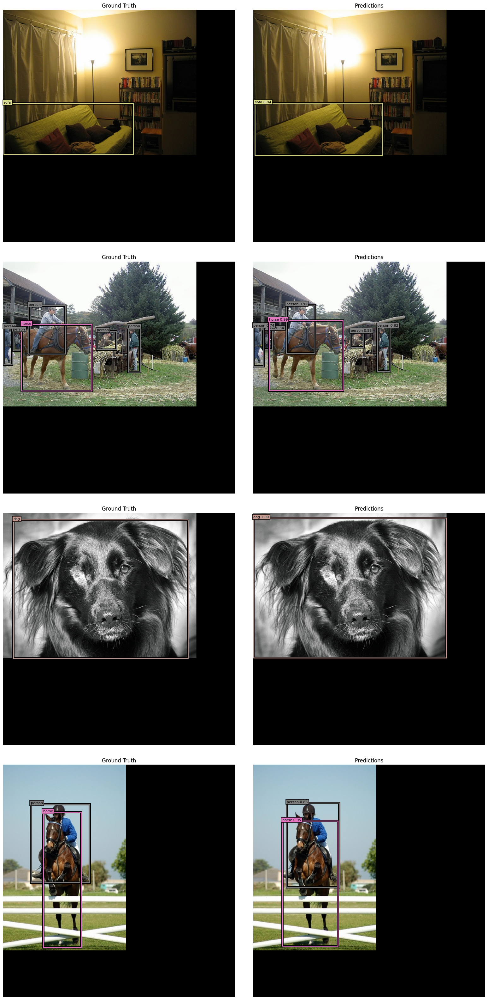

In [99]:
inference(
    model=object_detection_learn.model,
    batch_num=10,
    detect_thresh=0.5,
    iou_thresh=0.2
)

# COCO Metrics

We can get some quantitative estimates on how well our model performs using pycocotools.

In [ ]:
#| code-fold: true
#| code-summary: "COCO metric helper functions"

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from fastai.vision.all import chunked
import json


with open(path_2007/'test.json') as f:
    test_ground_truth = json.load(f)


def record_predictions(model, detect_thresh=0.35, iou_thresh=0.5):
    results = []
    batch_size = 8
    image_size = 600
    anchors = torch.stack([
        generate_anchor_boxes(image_size).to(torch.float32)
        for _ in range(batch_size)
    ])
    image_ids = [o['id'] for o in test_ground_truth['images']]
    image_id_batches = chunked(image_ids, chunk_sz=8)
    model.eval()

    for batch, image_id_batch in zip(object_detection_valid_dl, image_id_batches):
        images, *_ = batch

        with torch.no_grad():
            boxes, classes = model(images.to(def_device))
        
        pred_boxes = compute_pred_boxes(boxes, anchors)
        pred_boxes = box_convert(pred_boxes, 'cxcywh', 'xyxy')

        for pred_box, pred_class, image_id, in zip(pred_boxes, classes, image_id_batch):
            pred_box, pred_class, pred_scores = postprocess(
                pred_box, pred_class, detect_thresh, iou_thresh
            )
            pred_box = box_convert(pred_box, in_fmt='xyxy', out_fmt='xywh')
            for cat_id, box, score in zip(pred_class, pred_box, pred_scores):
                results.append({
                    'image_id': image_id,
                    'category_id': cat_id.item() + 1,
                    'bbox': [round(o, 2) for o in box.tolist()],
                    'score': round(score.item(), 3),
                })
    return results


def get_coco_scores(
        model,
        ground_truth_path=path_2007/'test.json',
        annotation_type='bbox',
        detect_thresh=0.35,
        iou_thresh=0.5
    ):
    test_results = record_predictions(
        model,
        detect_thresh=detect_thresh,
        iou_thresh=iou_thresh
    )
    with open('results/results.json', 'w') as f:
        json.dump(test_results, f)
    coco_ground_truth = COCO(ground_truth_path)
    coco_predictions = coco_ground_truth.loadRes('results/results.json')
    coco_eval = COCOeval(coco_ground_truth, coco_predictions, annotation_type)
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

In [86]:
get_coco_scores(
    model=object_detection_learn.model,
    detect_thresh=0.5,
    iou_thresh=0.2
)

loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.28s).
Accumulating evaluation results...
DONE (t=0.53s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.440
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.640
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.485
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.036
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.254
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.560
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.388
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.488
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

# Results on Example Image

Finally, we'll do inference on the example image we saw [at the beginning of this post](#overview-and-setup) and get the bounding boxes we saw there.

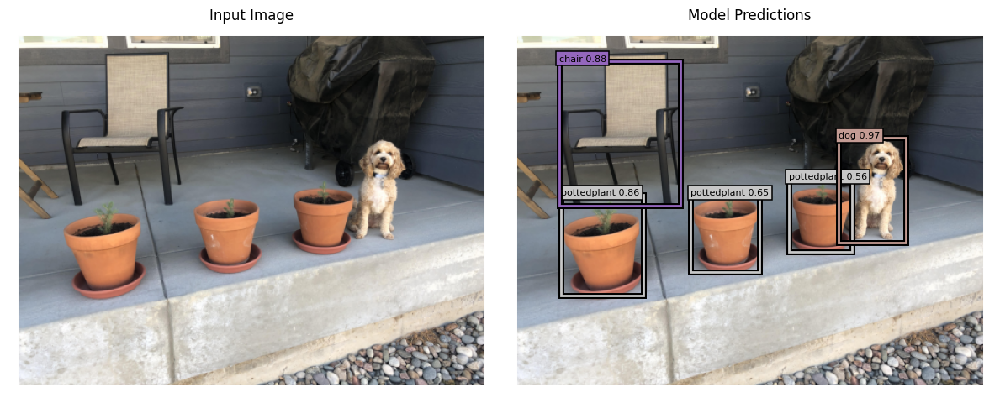

In [101]:
from fastai.vision.all import load_image

img = load_image('example_image.png', mode='RGB')
img = np.array(img)
img = multilabel_valid_tfms(image=img)['image']
img = torch.from_numpy(img)
img = img.permute(2, 0, 1)[None]
img = img.to(def_device)

with torch.no_grad():
    boxes, classes = object_detection_learn.model(img)

boxes, classes = boxes[0], classes[0]
anchors = generate_anchor_boxes(600)
pred_boxes = compute_pred_boxes(boxes, anchors)
pred_boxes = box_convert(pred_boxes, 'cxcywh', 'xyxy')
boxes, classes, scores = postprocess(
    pred_boxes, classes, detect_thresh=0.5, iou_thresh=0.2
)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
axs[0].imshow(load_image('example_image.png'))
axs[0].axis('off')
axs[0].set_title('Input Image')
plot_image_with_inference_annotations(
    load_image('example_image.png'), boxes, classes, scores, ax=axs[1]
)
axs[1].set_title('Model Predictions')
fig.tight_layout()
plt.show()